# AI 스타일 영상 만들기
## Stable Diffusion + ControlNet + EbSynth

> [빵형의 개발도상국](https://www.youtube.com/@bbanghyong)

## 1. 원본 영상 -> 프레임

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!rm -r /content/drive/MyDrive/Dataset/raw_video/frames

In [ ]:
!mkdir /content/drive/MyDrive/Dataset/raw_video/frames

### 샘플 영상 다운로드

In [ ]:
import cv2

cap = cv2.VideoCapture("/content/drive/MyDrive/Dataset/raw_video/theway.mov")

i = 0

while cap.isOpened():
    ret, img = cap.read()

    if not ret:
        break

    cv2.imwrite(f"/content/drive/MyDrive/Dataset/raw_video/frames/{str(i).zfill(5)}.png", img)

    i += 1

## 2. 스타일 변경 작업

Stable Diffusion + ControlNet

### ControlNet

In [ ]:
!pip install -qq opencv-contrib-python diffusers transformers git+https://github.com/huggingface/accelerate.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
from glob import glob

frame_list = sorted(glob("/content/drive/MyDrive/Dataset/raw_video/frames/*.png"))

f_number = len(frame_list)

796

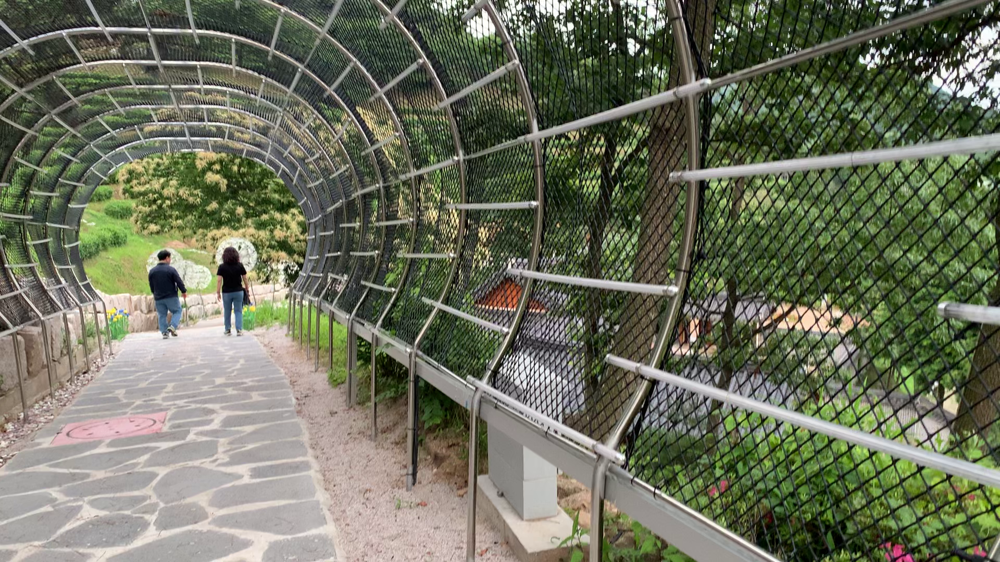

In [ ]:
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image

image = load_image(frame_list[0])

image

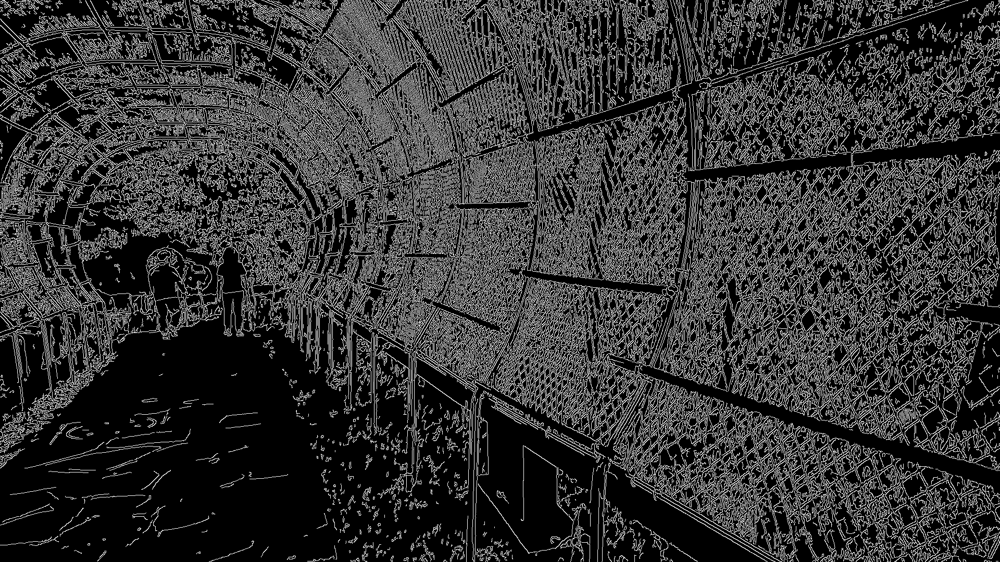

In [ ]:
import cv2
from PIL import Image
import numpy as np

low_threshold = 100
high_threshold = 200

np_image = np.array(image)

canny_image = cv2.Canny(np_image, low_threshold, high_threshold)

canny_image = canny_image[:, :, None]
canny_image = np.concatenate([canny_image, canny_image, canny_image], axis=2)
canny_image = Image.fromarray(canny_image)

canny_image

In [ ]:
canny_image = canny_image.resize((1920, 1080))
canny_image.size

(1280, 720)

In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
from diffusers import UniPCMultistepScheduler
import torch

controlnet_model = "lllyasviel/sd-controlnet-canny"
sd_model = "stablediffusionapi/realistic-vision-v20-2047"

controlnet = ControlNetModel.from_pretrained(
    controlnet_model,
    torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    sd_model, controlnet=controlnet, torch_dtype=torch.float16,
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()

unet/diffusion_pytorch_model.safetensors not found
/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/256 [00:00<?, ?it/s]

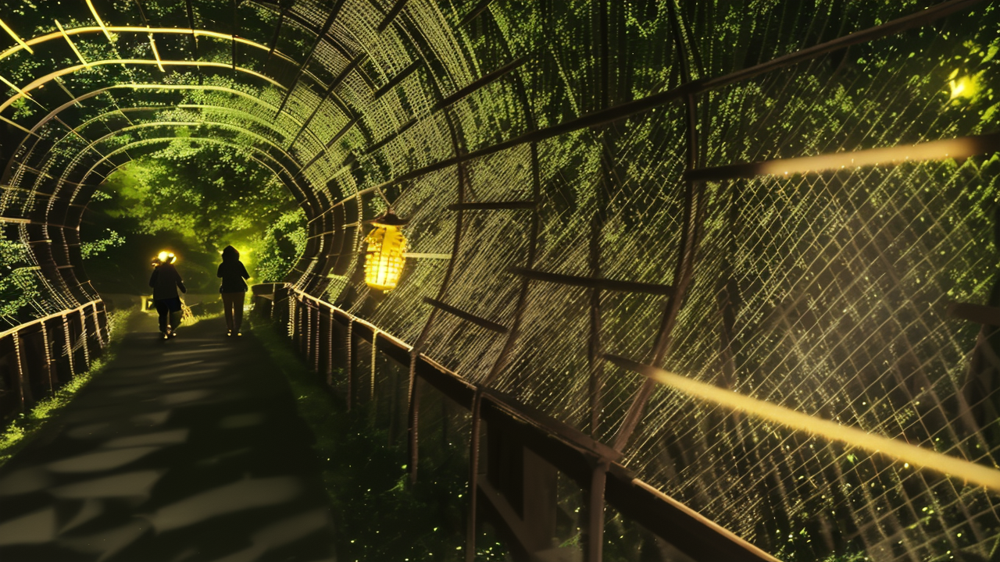

In [ ]:
prompt = "It's a picture of walking along a very beautiful path in the mountains. Fireflies are flying around, and the scenery is lit by the gentle moonlight. It's a scene with a hand-held lantern."

num_steps = 256
seed = 12

out_image = pipe(
    prompt,
    num_inference_steps=num_steps,
    generator=torch.manual_seed(seed),
    image=canny_image
).images[0]

out_image

### 원본 이미지와 사이즈 일치시키기

In [ ]:
print(image.size)
print(out_image.size)

(1920, 1080)
(1280, 720)


In [ ]:
out_image = out_image.resize(image.size)

print(out_image.size)

(1920, 1080)


In [ ]:
!mkdir /content/drive/MyDrive/Dataset/raw_video/output

In [ ]:
out_image.save("/content/drive/MyDrive/Dataset/raw_video/output/00000.png")

### 마지막 프레임 스타일 변경

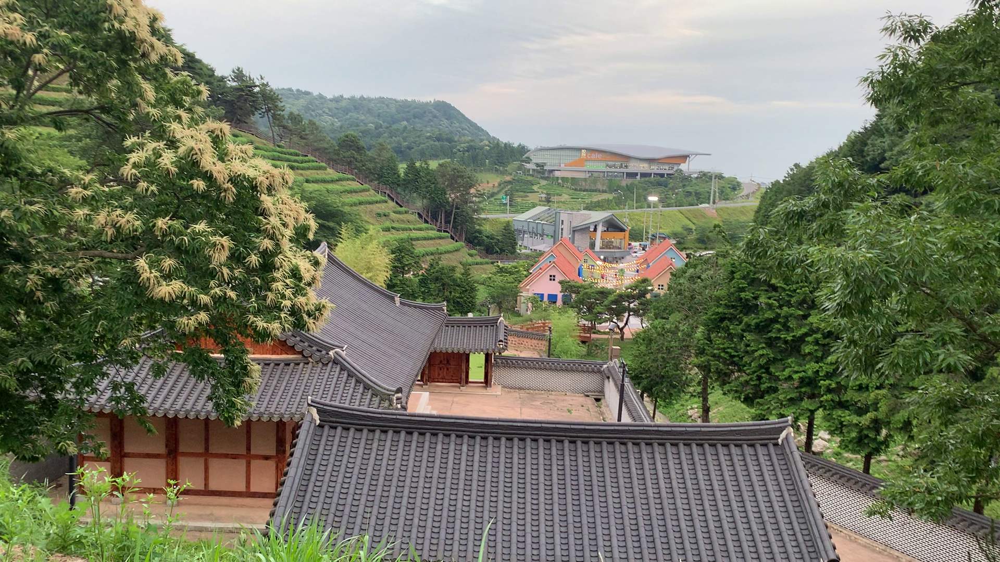

In [ ]:
image = load_image(frame_list[-1])

image

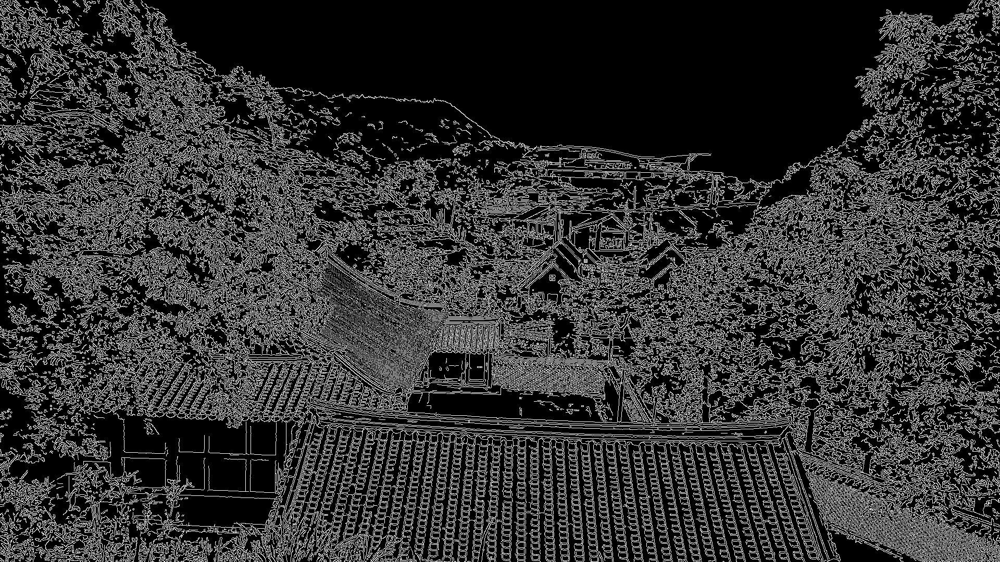

In [ ]:
low_threshold = 100
high_threshold = 200

np_image = np.array(image)

canny_image = cv2.Canny(np_image, low_threshold, high_threshold)

canny_image = canny_image[:, :, None]
canny_image = np.concatenate([canny_image, canny_image, canny_image], axis=2)
canny_image = Image.fromarray(canny_image)

canny_image

In [ ]:
canny_image = canny_image.resize((1920, 1080))
canny_image.size

(1280, 720)

  0%|          | 0/256 [00:00<?, ?it/s]

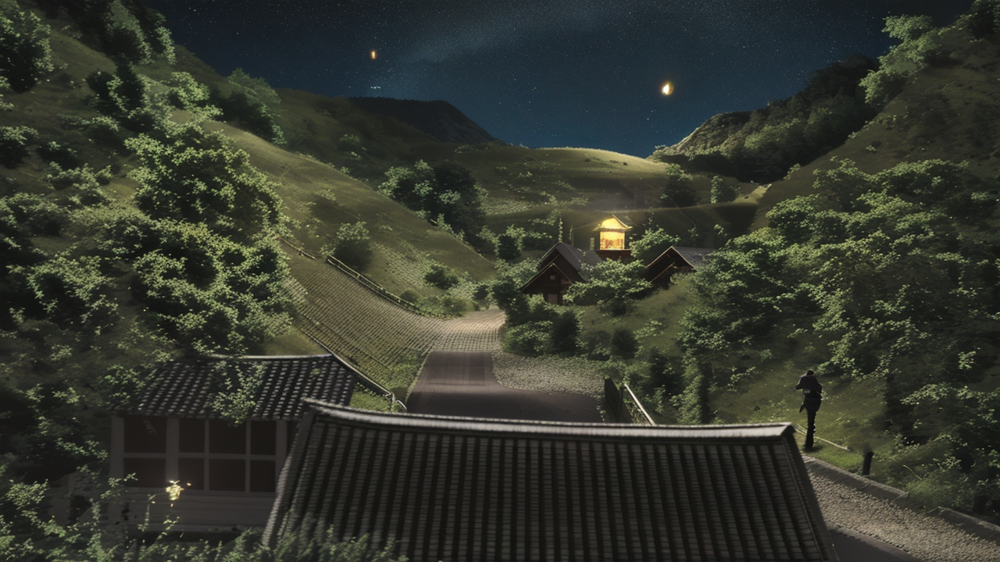

In [ ]:
prompt = "It's a picture of walking along a very beautiful path in the mountains. Fireflies are flying around, and the scenery is lit by the gentle moonlight. It's a scene with a hand-held lantern."
num_steps = 256
seed = 12

out_image = pipe(
    prompt,
    num_inference_steps=num_steps,
    generator=torch.manual_seed(seed),
    image=canny_image
).images[0]

out_image

In [ ]:
out_image = out_image.resize(image.size)

out_image.save("/content/drive/MyDrive/Dataset/raw_video_2/output/00" + str(f_number) + ".png")

### 모든 결과 다운로드

In [ ]:
!zip -r -q /content/drive/MyDrive/Dataset/raw_video_2/ebsynth.zip /content/drive/MyDrive/Dataset/raw_video_2/frames /content/drive/MyDrive/Dataset/raw_video_2/output

## 3. EbSynth

https://ebsynth.com

## 4. 결과 프레임 -> 영상

In [ ]:
!unzip -q /content/drive/MyDrive/Dataset/raw_video_2/out_00000.zip

In [ ]:
from glob import glob

img_list = sorted(glob("/content/drive/MyDrive/Dataset/raw_video_2/out_00000/*.png"))

len(img_list)

100

In [ ]:
import cv2

img = cv2.imread(img_list[0])

H, W, _ = img.shape
FPS = 30

fourcc = cv2.VideoWriter_fourcc('m', 'p', '4', 'v')
out = cv2.VideoWriter("/content/drive/MyDrive/Dataset/raw_video_2/result.mp4", fourcc, FPS, (W, H))

for img_path in img_list:
    img = cv2.imread(img_path)
    out.write(img)

out.release()